In [1]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL.Image
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.stem import PorterStemmer
from collections import Counter
nltk.download('omw-1.4')
nltk.download('wordnet')
from wordcloud import WordCloud#, STOPWORDS
from gensim.parsing.preprocessing import remove_stopwords, STOPWORDS
import re
from copy import deepcopy
from tqdm import tqdm
import plotly.graph_objs as go
import plotly.offline as pyo
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('tags')
nltk.download('universal_tag')
nltk.download('punkt')


[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /home/debodeep94/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/debodeep94/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/debodeep94/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/debodeep94/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/debodeep94/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Error loading tags: Package 'tags' not found in index
[nltk_data] Error loading universal_tag: Package 'universal_tag' not
[nltk_data]     found in index
[nltk_data] Downloading package punkt to /home/debodeep94/nltk_

True

In [2]:
def final_text(text):
    stopword = set(stopwords.words("english"))
    prepositions_en = ['a', 'an', 'the', 'before', 'beneath', 'between', 'beyond', 'in', 
                   'into', 'on', 'onto', 'up', 'upon', 'unto', 'under',
                   'also', 'about', 'among']
    #others_2_en = ['india', 'country', 'nation']
    verbs = ['must', 'shall', 'should', 'will', 'am', 'is', 'are', 'take','takes', 'taking', 'give']
    others_1_en = ['however', 'whatever', 'nevertheless','whether', 'therefore', 'hence', 'country', 'countrymen','countryman', 'nation', 'india']
    pronouns = ['i', 'we', 'he', 'she', 'they', 'us', 'it', 'me', 'his', 'him','countries', 'her', 'our', 'ours', 'this', 'that']
    cleaned_text = re.sub(r'[^a-zA-Z0-9\s]', '', text).lower()
    cleaned_text = re.sub(r'[:\(\)?]', '', cleaned_text)
    words_remove = prepositions_en+verbs+others_1_en+pronouns
    words = word_tokenize(cleaned_text)
    filtered_words = [word for word in words if word.lower() not in words_remove  and word.lower() not in stopword]
    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    lemmatized_words = [lemmatizer.lemmatize(word) for word in filtered_words]
    output = ' '.join(lemmatized_words)
    #print(filtered_text)
    #stopword.add('s')
    return output

def bag_of_words(year):
    '''
    input: list
    output: list
    return a list with  of words for the chosen years
    '''
    speech_box = []
    for i in year:
        year_speech = final_text(text_ind_speech[i])
        speech_box.append(year_speech)
    #pattern = r'\bcountry\w*'
    #matches = re.findall(pattern, speech_box)
    #print(matches)
    return speech_box
        

In [3]:
path_speeches = './pm_speaks_vajpayee/abv/'   
#print(path_speeches)
# relative path to speech files
text_file_extensions = tuple(('.txt'))#, '.docx'))
text_ind_speech = {}                                 

list_files_speeches = os.listdir(path_speeches)
#print(list_files_speeches)
for file in tqdm(list_files_speeches):
    
    if file.endswith(text_file_extensions):
        #print(file)
        with open(path_speeches+file, 'r') as f:
            text = f.read().replace('\n', ' ').replace("�", ' ')
            year = str(file)[:4] # I observed the extensions are coming as .txt.txt! So I take the first 4 characters.
            print(year)
            text_ind_speech.update({int(year):text})

100%|███████████████████████████████████████████| 6/6 [00:00<00:00, 2240.55it/s]

1999
2002
2001
1998
2000
2003


In [4]:
path_to_images = './'
image_file_extensions = tuple(('.jpg', '.png'))
image_name = 'india13.jpg'

mask_india = np.array(PIL.Image.open(path_to_images + image_name))

bg_colours = tuple(('white','black','blue'))
bg_colour  = bg_colours[1]

contour_colours = tuple(('white','black','blue'))
contour_colour  = contour_colours[0]

In [5]:
def generate_wc(first_val, last_val, max_words):
        result = bag_of_words(list(range(first_val, last_val+1)))
        #print(result)
        text_corpus = ' '.join(result)
        #print(text_corpus)
        pattern = r'\bcountry\w*'
        matches = re.findall(pattern, text_corpus)
        #print(matches)
        # Count the frequency of each word
        word_counts = Counter(text_corpus.split())
        wc = WordCloud(
               mask=mask_india,
               max_words=max_words,colormap='cool',
               background_color='#F5F5F5',
               relative_scaling=0.5
               ).generate_from_frequencies(word_counts)
        
        # Print the top 5 most frequent words
        top_words = word_counts.most_common(5)
        print("Top 5 most frequent words:")
        for word, count in top_words:
            print(f"{word}: {count}")
        # Extract word and count data for plotting
        words = [word for word, _ in top_words]
        counts = [count for _, count in top_words]
        bar_colors = ['rgb(90, 90, 90)', 'rgb(90, 90, 90)', 'rgb(90, 90, 90)', 'rgb(90, 90, 90)', 'rgb(90, 90, 90)']
        # Create a bar plot using Plotly
        data = [go.Bar(x=words, y=counts, marker=dict(color=bar_colors))]
        layout = go.Layout(title=f'Top 5 Most Frequent Words', xaxis_title='Words', yaxis_title='Frequency')
        fig = go.Figure(data=data, layout=layout)
        plt.figure(dpi=1000)
        plt.imshow(wc)
        plt.axis(False)
        #savepath='./wordcloud_images/'
        #fig_name= 'plot_'+str(first_val)+'.png'
        ## Save and display the plot
        #savepath_plotly = './wordcloud_images/'
        #fig_name_plotly = 'plot_test'+str(first_val) + '_top5.png'
        #pyo.plot(fig, filename=savepath_plotly+ fig_name_plotly)
        #plt.savefig(savepath+fig_name)

Top 5 most frequent words:
independence: 20
year: 19
national: 18
government: 15
one: 14


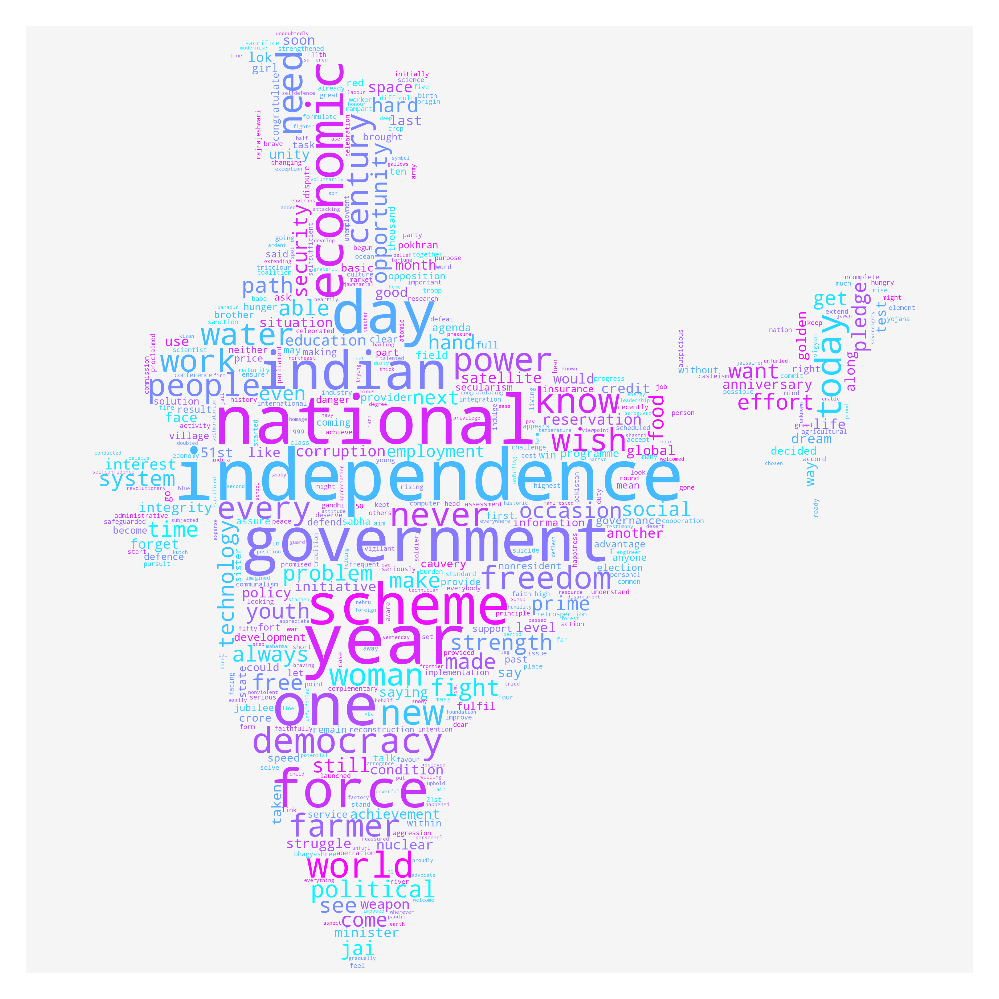

In [6]:
generate_wc(1998,1998, 500)

Top 5 most frequent words:
world: 21
let: 19
come: 12
today: 12
people: 11


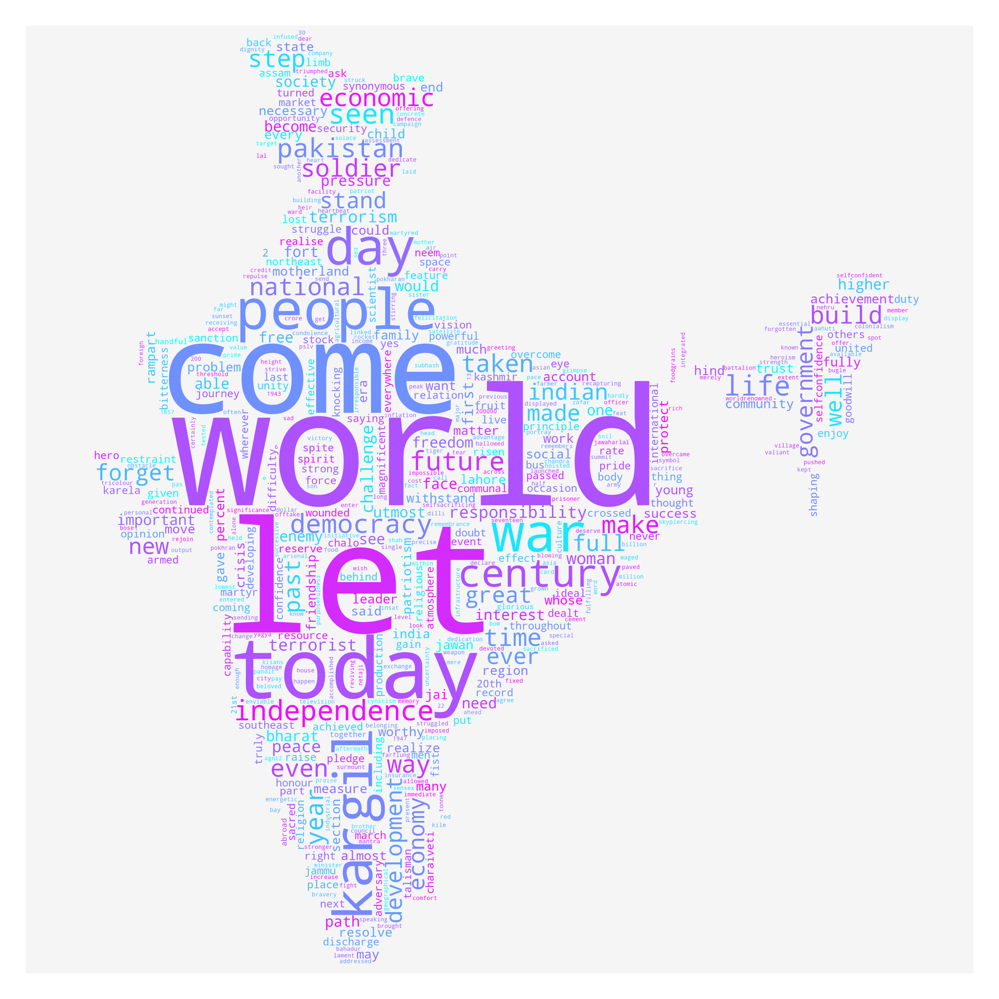

In [12]:
generate_wc(1999,1999, 500)

Top 5 most frequent words:
state: 16
year: 16
development: 14
government: 14
every: 13


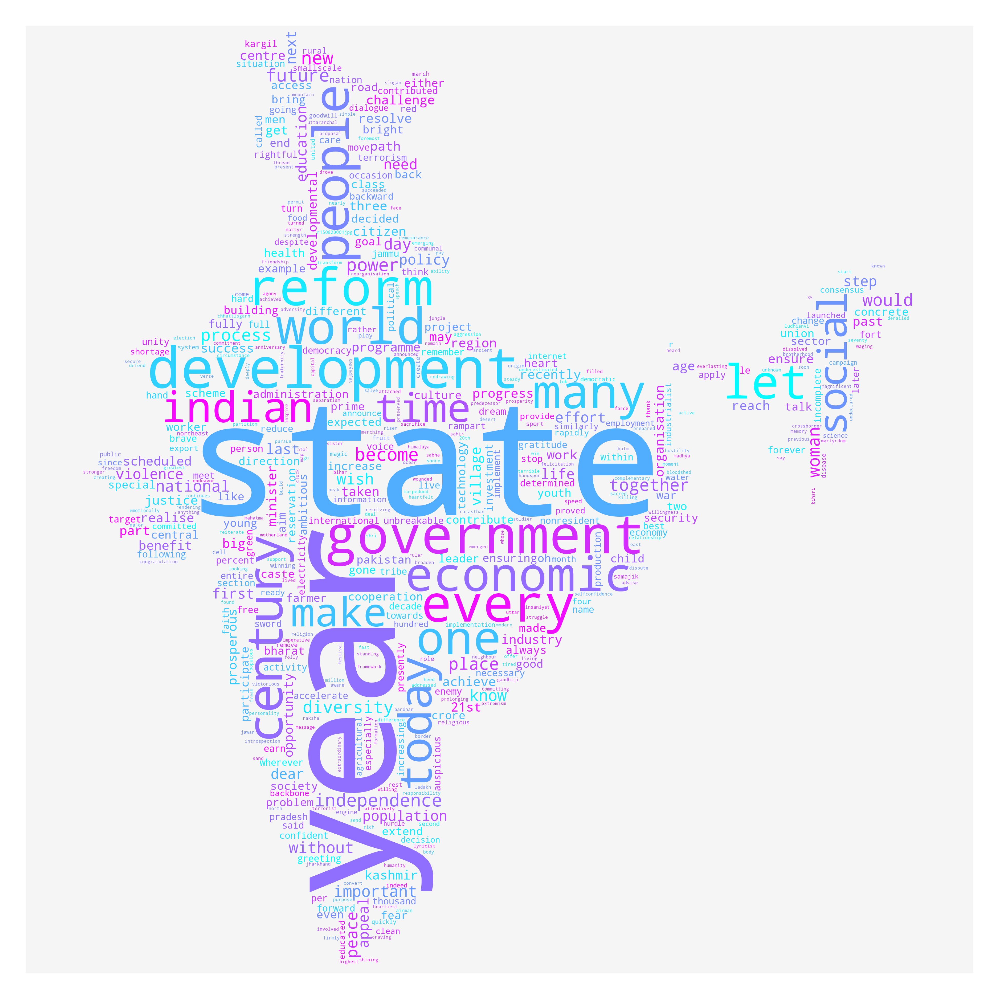

In [8]:
generate_wc(2000,2000, 500)

Top 5 most frequent words:
year: 25
new: 21
people: 18
government: 17
today: 11


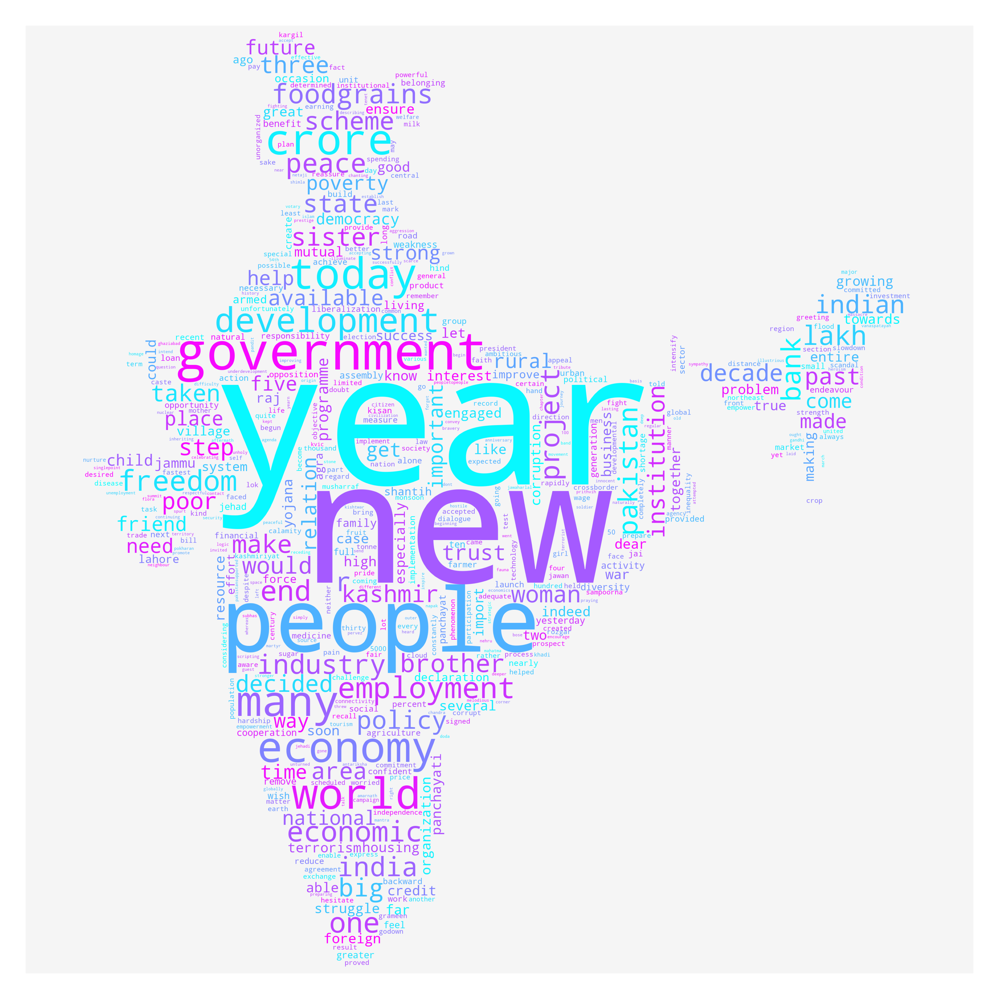

In [9]:
generate_wc(2001,2001, 500)

Top 5 most frequent words:
people: 15
kashmir: 14
jammu: 12
one: 12
today: 11


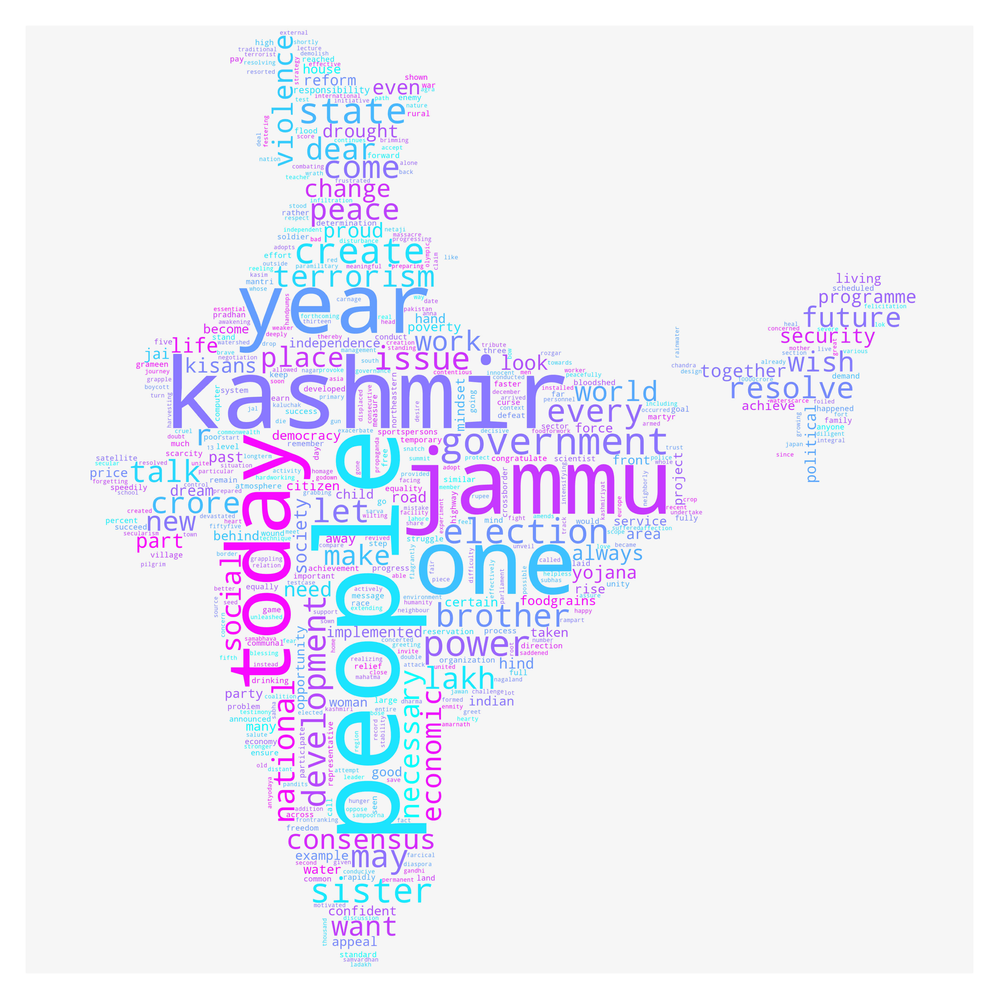

In [10]:
generate_wc(2002,2002, 500)

Top 5 most frequent words:
year: 27
people: 15
today: 15
new: 15
world: 13


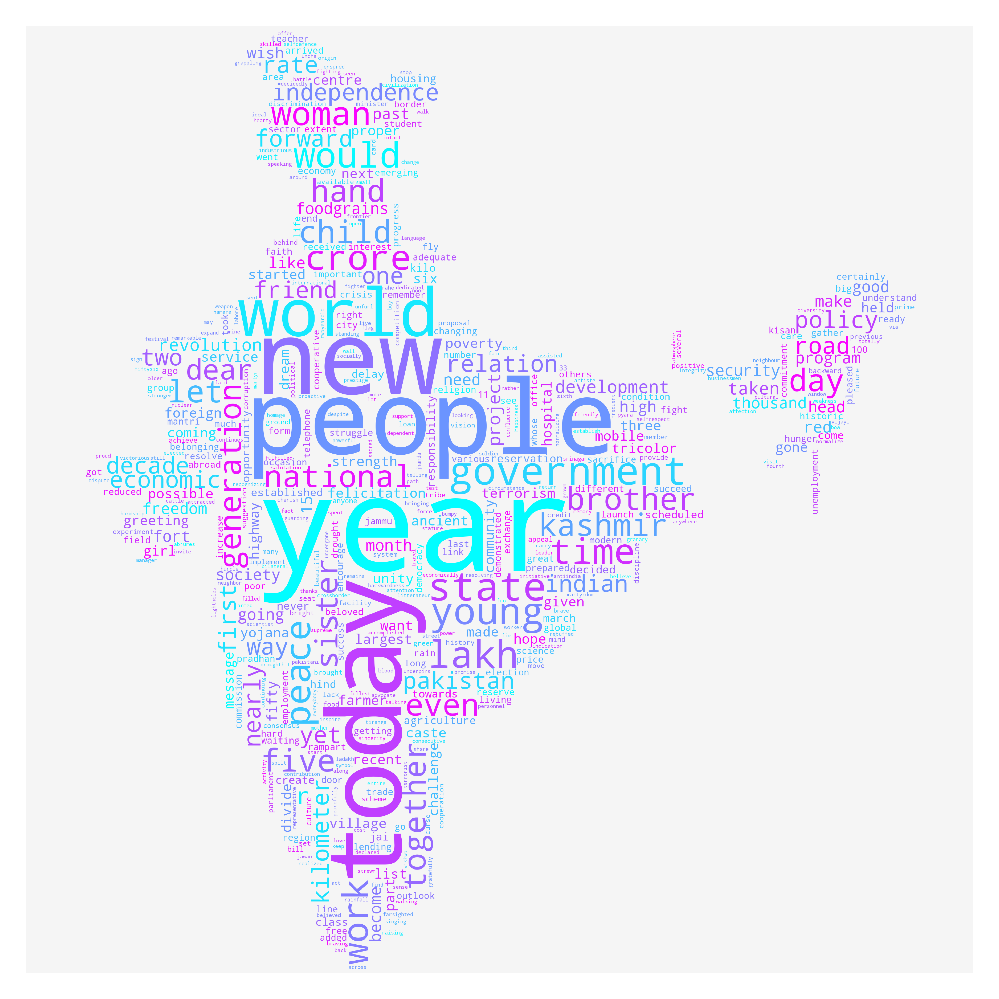

In [11]:
generate_wc(2003,2003, 500)